# A.3 Exact Decomposition for Bilinear Convolutional Tensors

In [2]:
# Now you can import modules from this directory
import torch
import os
from src.plotter import EigenvectorPlotter
from src.heist import load_model
import imageio
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.optim as optim
from torchvision.transforms import ToPILImage
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
import pickle
from src.heist import create_venv

In [3]:
import random

def create_random_dataset(size = 300):
    dataset = []
    for i in range(size):
        venv = create_venv(num_envs=1, start_level=random.randint(0, 1000000000), num_levels=0)
        dataset.append(venv.reset())
    return dataset
    

In [4]:
#some helper methods
import os
import matplotlib.pyplot as plt
import torch
def compute_exact_tensor_decomposition_version2(W, V):
    """
    Compute the exact tensor decomposition for bilinear convolutional tensors.
    
    Args:
    W, V: Tensors of shape (c_out, c_in, k, k)
    
    Returns:
    B_sym_list: List of symmetric bilinear forms for each output channel
    eigenvectors_list, eigenvalues_list: Lists of eigenvectors and eigenvalues for each output channel
    """
    c_out, c_in, k, _ = W.shape
    B_sym_list = torch.zeros(c_in, c_in, k*2, k*2)
    eigenvectors_list = []
    eigenvalues_list = []
    
    for i in range(c_out):
        W_i = W[i].reshape(c_in * k * k, 1)
        V_i = V[i].reshape(c_in * k * k, 1)
        B = torch.matmul(W_i, V_i.T)
        B_sym = (B + B.T) / 2
        eigenvalues, eigenvectors = torch.linalg.eigh(B_sym)
        idx = torch.argsort(eigenvalues, descending=True)
        eigenvalues = eigenvalues[idx]
        eigenvectors = eigenvectors[:, idx]
        eigenvectors_reshaped = eigenvectors.T.view(-1, c_in, k, k)  # Reshape into (num_eigenvectors, c_in, k, k)
        eigenvectors_list.append(eigenvectors_reshaped)
        eigenvalues_list.append(eigenvalues)
        B_sym_list.append(B_sym)
    
    # Stack all eigenvectors reshaped per channel to form (num_eigenvectors, c_out, c_in, k, k)
    all_eigenvectors = torch.stack(eigenvectors_list, dim=1)  # This should give us (num_eigenvectors, c_out, c_in, k, k)
    all_eigenvalues = torch.stack(eigenvalues_list, dim = 1)
    return B_sym_list, all_eigenvectors, all_eigenvalues
def plot_eigenvalues(eigenvalues, channel, output_dir):
    plt.figure(figsize=(10, 5))
    plt.plot(eigenvalues.cpu().numpy())
    plt.title(f'Eigenvalues for Channel {channel}')
    plt.xlabel('Index')
    plt.ylabel('Eigenvalue')
    plt.yscale('log')
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, f'eigenvalues_channel_{channel}.png'))
    plt.close()

def plot_top_k_eigenvectors(eigenvectors, eigenvalues, k, channel, c_in, kernel_size, output_dir):
    top_k_indices = torch.argsort(eigenvalues, descending=True)[:k]
    top_k_eigenvectors = eigenvectors[top_k_indices]  # Now accounts for multiple dimensions

    fig, axes = plt.subplots(k, c_in, figsize=(c_in * 3, k * 3))
    fig.suptitle(f'Top {k} Eigenvectors for Channel {channel}')

    for i, eigenvector in enumerate(top_k_eigenvectors):
        eigenvalue = eigenvalues[top_k_indices[i]].cpu().item()  # Fetch the corresponding eigenvalue
        for j in range(c_in):
            ax = axes[i, j] if k > 1 else axes[j]
            im = ax.imshow(eigenvector[j].cpu().numpy(), cmap='viridis', aspect='auto')
            ax.set_title(f'λ={eigenvalue:.2e}' if j == 0 else '')
            ax.axis('off')
        if k > 1:
            fig.colorbar(im, ax=axes[i, :], orientation='vertical', fraction=0.046, pad=0.04)
        else:
            fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'top_k_eigenvectors_channel_{channel}.png'))
    plt.close()

def visualize_decomposition(B_sym_list, eigenvectors_list, eigenvalues_list, top_k=5, base_dir="conv_exact_decomposition"):
    c_out = len(B_sym_list)  # Number of output channels
    c_in, k, _ = eigenvectors_list[0].shape[1:]  # Assuming all eigenvectors have the same shape

    os.makedirs(base_dir, exist_ok=True)
    for channel in range(c_out):
        channel_dir = os.path.join(base_dir, f'channel_{channel}')
        os.makedirs(channel_dir, exist_ok=True)

        print(f"Saving visualizations for Channel {channel}")
        plot_eigenvalues(eigenvalues_list[channel], channel, channel_dir)
        plot_top_k_eigenvectors(eigenvectors_list[channel], eigenvalues_list[channel], top_k, channel, c_in, k, channel_dir)



In [5]:
#New set of code refractored from the previous code
def compute_block(W, V):
    """
    Compute the exact tensor decomposition for bilinear convolutional tensors.
    
    Args:
    W, V: Tensors of shape (c_out, c_in, k, k)
    
    Returns:
    B: Tensor of shape (c_out, c_in*k*k, c_in*k*k)
    """
    c_out, c_in, k, _ = W.shape
    B = torch.zeros(c_out, c_in*k*k, c_in*k*k, device=W.device, dtype=W.dtype)
    
    for l in range(c_out):
        W_outl = W[l]  # c_in by k by k
        V_outl = V[l]  # c_in by k by k
        for i in range(c_in):
            for j in range(c_in):
                W_i = W_outl[i]  # k x k
                V_j = V_outl[j]  # k x k
                W_i_f = W_i.reshape(-1)  # k*k
                V_j_f = V_j.reshape(-1)  # k*k
                block = torch.outer(W_i_f, V_j_f)  # k*k x k*k
                B[l, i*k*k:(i+1)*k*k, j*k*k:(j+1)*k*k] = block
    #Symmetrysing B            
    B_sym = torch.zeros_like(B)
    for o in range(c_out):
        B_sym[o] = 0.5 * (B[o] + B[o].T) 
    return B_sym

In [6]:
W = torch.rand(2, 6, 18, 18)  # c_out=3, c_in=2, k=4
V = torch.rand(2, 6, 18, 18)  # Same shape as W

# Create the 3D block matrix
B = compute_block(W, V)

print("Shape of W:", W.shape)
print("Shape of V:", V.shape)
print("Shape of B:", B.shape)

for k in range(W.size(0)):
    for i in range(W.size(1)):
        for j in range(W.size(1)):
            output =torch.outer(W[k][i].reshape(-1),V[k][j].reshape(-1))
            for n in range(W.size(2)**2):
                assert torch.allclose(B[k][i*W.size(2)**2+n,j*W.size(2)**2: (j+1)*W.size(2)**2],output[n])
            for n in range(W.size(2)**2):            
                assert torch.allclose(B[k][i*W.size(2)**2:(i+1)*W.size(2)**2,j*W.size(2)**2+n],output[:,n])


Shape of W: torch.Size([2, 6, 18, 18])
Shape of V: torch.Size([2, 6, 18, 18])
Shape of B: torch.Size([2, 1944, 1944])


AssertionError: 

In [7]:
model_path = '/mnt/ssd-1/mechinterp/narmeen/bilinear_experiments_official/bilinear_experiments/bilinear_models/bimpala_heist_simplified.pt'

model =load_model(model_path,7)
print(model)
#state dictionary of the model
for k in model.state_dict():
    print(k)
state_dict = model.state_dict()


/mnt/ssd-1/mechinterp/narmeen/bilinear_experiments_official/bilinear_experiments/src/heist.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model

Model loaded from /mnt/ssd-1/mechinterp/narmeen/bilinear_experiments_official/bilinear_experiments/bilinear_models/bimpala_heist_simplified.pt
BimpalaCNN(
  (conv): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (conv_seqs): ModuleList(
    (0-2): 3 x ConvSequence(
      (max_pool2d): MaxPool2d(kernel_size=7, stride=2, padding=3, dilation=1, ceil_mode=False)
      (res_block0): ResidualBlock(
        (conv0): Conv2d(32, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
        (conv1): Conv2d(32, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
      )
      (res_block1): ResidualBlock(
        (conv0): Conv2d(32, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
        (conv1): Conv2d(32, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
      )
    )
  )
  (hidden_fc1): Linear(in_features=2048, out_features=256, bias=False)
  (hidden_fc2): Linear(in_features=2048, out_features=256, bias=False)
 

In [8]:
W = state_dict["conv_seqs.2.res_block1.conv0.weight"]
V = state_dict["conv_seqs.2.res_block1.conv1.weight"]
B_sym_list, eigenvectors, eigenvalues = compute_exact_tensor_decomposition_version2(W, V)
print(eigenvalues.shape, eigenvectors.shape)
#visualize_decomposition(B_sym_list, eigenvectors, eigenvalues, top_k=3)

torch.Size([1568, 32]) torch.Size([1568, 32, 32, 7, 7])


In [9]:
eigenvectors.shape

torch.Size([1568, 32, 32, 7, 7])

In [10]:
#iteration 3 with structure loss and content weight boost up to 10
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch.nn.functional as F
import matplotlib.pyplot as plt
import os

class TensorDataset(Dataset):
    def __init__(self, tensors):
        self.tensors = [torch.as_tensor(t, dtype=torch.float32) if isinstance(t, np.ndarray) else t for t in tensors]

    def __len__(self):
        return len(self.tensors)

    def __getitem__(self, idx):
        return self.tensors[idx]

class FeatureVisualizer:
    def __init__(self, model, eigenvector, eigenvalue, target_layer_name, dataset, device):
        self.model = model
        self.eigenvector = eigenvector.to(device)
        self.eigenvalue = eigenvalue
        self.dataset = TensorDataset(dataset)
        self.activations = None
        self.device = device
        self.register_hook(target_layer_name)

    def register_hook(self, layer_name):
        for name, module in self.model.named_modules():
            if name == layer_name:
                module.register_forward_hook(self.hook_fn)
                return
        raise ValueError(f"Layer {layer_name} not found in the model.")

    def hook_fn(self, module, input, output):
        self.activations = output

    def get_random_image(self):
        idx = torch.randint(0, len(self.dataset), (1,)).item()
        img = self.dataset[idx]
        return img.to(self.device)

    def visualize(self, num_iterations=5000, lr=0.01, content_weight=10.0, tv_weight=0.001, structure_weight=5.0):
        input_tensor = self.get_random_image().clone().requires_grad_(True)
        
        # Create a binary mask of the maze structure
        maze_structure = (input_tensor > 0.5).float()
        
        optimizer = optim.Adam([input_tensor], lr=lr)

        for i in range(num_iterations):
            optimizer.zero_grad()
            
            _ = self.model(input_tensor)
            
            if self.activations is None:
                raise RuntimeError("Activations not captured - check the layer name and hook setup.")
            
            # Compute feature loss
            feature_loss = 0
            for c in range(self.activations.shape[1]):  # Iterate over channels
                activation_channel = self.activations[:, c, :, :]
                eigenvector_channel = self.eigenvector[c].unsqueeze(0)  # Make it 3D: [1, 7, 7]
                conv_result = F.conv2d(activation_channel.unsqueeze(1), eigenvector_channel.unsqueeze(0), padding='same')
                feature_loss -= self.eigenvalue * conv_result.sum()
            
            # Compute content loss
            content_loss = F.mse_loss(input_tensor, self.get_random_image())
            
            # Structure preservation loss
            structure_loss = F.mse_loss(input_tensor * maze_structure, input_tensor)
            
            # Total variation regularization
            tv_loss = torch.sum(torch.abs(input_tensor[:,:,:-1,:] - input_tensor[:,:,1:,:])) + \
                      torch.sum(torch.abs(input_tensor[:,:,:,:-1] - input_tensor[:,:,:,1:]))
            
            loss = feature_loss + content_weight * content_loss + structure_weight * structure_loss + tv_weight * tv_loss
            
            loss.backward()
            optimizer.step()

            with torch.no_grad():
                # Clamp values and enforce maze structure
                input_tensor.clamp_(0, 1)
                input_tensor.data = input_tensor.data * maze_structure + (1 - maze_structure) * 0.5

            if (i + 1) % 500 == 0:
                print(f'Iteration {i+1}/{num_iterations}, Loss: {loss.item():.4f}')

        return self.tensor_to_image(input_tensor.detach())

    def tensor_to_image(self, tensor):
        img = tensor.squeeze().cpu().numpy()
        img = (img * 255).astype(np.uint8)
        
        fig, ax = plt.subplots()
        ax.imshow(img)
        ax.axis('off')
        return fig

def visualize_eigenvectors(model, eigenvectors_list, eigenvalues_list, target_layer_name, dataset, device, output_dir='maze_eigenvector_visualizations', num_visualizations=5):
    os.makedirs(output_dir, exist_ok=True)

    for channel, (eigenvectors, eigenvalues) in enumerate(zip(eigenvectors_list, eigenvalues_list)):
        for i, (eigenvector, eigenvalue) in enumerate(zip(eigenvectors, eigenvalues)):
            print(f"Processing channel {channel}, eigenvector {i}")
            print("Shape of eigenvector:", eigenvector.shape)
            
            visualizer = FeatureVisualizer(model, eigenvector, eigenvalue, target_layer_name, dataset, device)
            
            for j in range(num_visualizations):
                fig = visualizer.visualize(content_weight=10.0, tv_weight=0.001, structure_weight=5.0)
                fig.savefig(os.path.join(output_dir, f'channel_{channel}_eigenvector_{i}_viz_{j}.png'), dpi=300, bbox_inches='tight')
                plt.close(fig)

            print(f"Saved {num_visualizations} visualizations for channel {channel}, eigenvector {i}")

In [11]:
def load_and_combine_datasets(num_files, dataset_folder=""):
    # List to hold all observations from all datasets
    all_observations = []
    
    # Generate file names based on known naming pattern
    dataset_files = [f'datasets/dataset{i}.pickle' for i in range(num_files)]

    # Loop through each file, load it, and extend the master list
    for dataset_file in dataset_files:
        file_path = os.path.join(dataset_folder, dataset_file)
        with open(file_path, 'rb') as file:
            data = pickle.load(file)
            all_observations.extend(data)
    
    return all_observations
dataset = load_and_combine_datasets(5)

FileNotFoundError: [Errno 2] No such file or directory: 'dataset0.pickle'

In [8]:
print(state_dict.keys())

odict_keys(['bfc1', 'bfc2', 'conv_seqs.0.conv.weight', 'conv_seqs.0.conv.bias', 'conv_seqs.0.res_block0.b_0', 'conv_seqs.0.res_block0.b_1', 'conv_seqs.0.res_block0.conv0.weight', 'conv_seqs.0.res_block0.conv0.bias', 'conv_seqs.0.res_block0.conv1.weight', 'conv_seqs.0.res_block0.conv1.bias', 'conv_seqs.0.res_block0.conv2.weight', 'conv_seqs.0.res_block0.conv2.bias', 'conv_seqs.0.res_block1.b_0', 'conv_seqs.0.res_block1.b_1', 'conv_seqs.0.res_block1.conv0.weight', 'conv_seqs.0.res_block1.conv0.bias', 'conv_seqs.0.res_block1.conv1.weight', 'conv_seqs.0.res_block1.conv1.bias', 'conv_seqs.0.res_block1.conv2.weight', 'conv_seqs.0.res_block1.conv2.bias', 'conv_seqs.1.conv.weight', 'conv_seqs.1.conv.bias', 'conv_seqs.1.res_block0.b_0', 'conv_seqs.1.res_block0.b_1', 'conv_seqs.1.res_block0.conv0.weight', 'conv_seqs.1.res_block0.conv0.bias', 'conv_seqs.1.res_block0.conv1.weight', 'conv_seqs.1.res_block0.conv1.bias', 'conv_seqs.1.res_block0.conv2.weight', 'conv_seqs.1.res_block0.conv2.bias', 'con

In [7]:
# Check if CUDA is available
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU is available. Using CUDA.")
else:
    device = torch.device("cpu")
    print("GPU is not available. Using CPU.")

GPU is available. Using CUDA.


In [49]:
target_layer_name = "conv_seqs.2.res_block1" # Adjust this to match your model's layer name
visualize_eigenvectors(
    model.to(device),
    eigenvectors_list,
    eigenvalues_list,
    "conv_seqs.2.res_block1",  # Adjust this to match your model's layer name
    dataset,
    device,
    output_dir='eigenvector_visualizations',
    num_visualizations=5  # Number of visualizations per eigenvector
)

Processing channel 0, eigenvector 0
Shape of eigenvector: torch.Size([32, 7, 7])


NotImplementedError: Only 2D, 3D, 4D, 5D padding with non-constant padding are supported for now

In [10]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset

class TensorDataset(Dataset):
    def __init__(self, tensors):
        # Convert input data to tensors if they are NumPy arrays
        self.tensors = [torch.as_tensor(t, dtype=torch.float32) if isinstance(t, np.ndarray) else t for t in tensors]

    def __len__(self):
        return len(self.tensors)

    def __getitem__(self, idx):
        return self.tensors[idx]

class EigenvectorVisualizer:
    def __init__(self, model, eigenvectors, eigenvalues, target_layer_name, dataset, device):
        self.model = model.to(device)
        self.eigenvectors = eigenvectors.to(device)
        self.eigenvalues = eigenvalues.to(device)
        self.dataset = TensorDataset(dataset)
        self.activations = None
        self.device = device
        self.register_hook(target_layer_name)

    def register_hook(self, layer_name):
        # Register a forward hook on the specified layer to capture activations
        for name, module in self.model.named_modules():
            if name == layer_name:
                module.register_forward_hook(self.hook_fn)
                return
        raise ValueError(f"Layer {layer_name} not found in the model.")

    def hook_fn(self, module, input, output):
        # Detach the output to prevent modifications to the computational graph
        # Process the output through the eigenvector filters and store it
        print("activations at target layer shape ", output.shape)
        self.activations = self.apply_eigenvectors(output.detach())

    def apply_eigenvectors(self, activations):
        batch_size, c_in, h, w = activations.shape
        output_activations = torch.zeros((batch_size, self.eigenvectors.shape[1], h, w), device=self.device)

        for i, eigenvector in enumerate(self.eigenvectors):
            # Perform convolution with the eigenvector
            filtered = F.conv2d(activations, eigenvector, padding=3)
            filtered_squared = filtered ** 2

            # Correctly expand eigenvalues for broadcasting
            # Assuming eigenvalues is [num_eigenvectors, c_out]

            eigenvalue = self.eigenvalues[i].unsqueeze(0).unsqueeze(2).unsqueeze(3)  # Shape should be [1, c_out, 1, 1]
            scaled_filtered = eigenvalue * filtered_squared

            # Accumulate the scaled results
            output_activations += scaled_filtered
 

        return output_activations

    def process_dataset(self):
        # Iterate through the dataset and print eigenvector activations for each item
        for i in range(len(self.dataset)):
            input_tensor = self.dataset[i].to(self.device)
            self.model(input_tensor)
            print(f"Activations for sample {i}: {self.activations.shape}")



In [14]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

class EigenvectorVisualizer:
    def __init__(self, model, eigenvectors, eigenvalues, target_layer_name, dataset, device):
        self.model = model.to(device)
        self.eigenvectors = eigenvectors.to(device)
        self.eigenvalues = eigenvalues.to(device)
        self.dataset = TensorDataset(dataset)
        self.activations = None
        self.device = device
        self.register_hook(target_layer_name)
        self.activation_records = []

    def register_hook(self, layer_name):
        # Register a forward hook on the specified layer to capture activations
        for name, module in self.model.named_modules():
            if name == layer_name:
                module.register_forward_hook(self.hook_fn)
                return
        raise ValueError(f"Layer {layer_name} not found in the model.")

    def hook_fn(self, module, input, output):
      
        self.activations = self.apply_eigenvectors(output.detach())

    def apply_eigenvectors(self, activations):
        batch_size, c_in, h, w = activations.shape
        output_activations = torch.zeros((batch_size, self.eigenvectors.shape[1], h, w), device=self.device)

        for i, eigenvector in enumerate(self.eigenvectors):
            # Perform convolution with the eigenvector
            filtered = F.conv2d(activations, eigenvector, padding=3)
            filtered_squared = filtered ** 2

            # Correctly expand eigenvalues for broadcasting
            # Assuming eigenvalues is [num_eigenvectors, c_out]

            eigenvalue = self.eigenvalues[i].unsqueeze(0).unsqueeze(2).unsqueeze(3)  # Shape should be [1, c_out, 1, 1]
            scaled_filtered = eigenvalue * filtered_squared

            # Accumulate the scaled results
            output_activations += scaled_filtered
        return output_activations

    def process_dataset(self):
        for i, input_tensor in enumerate(self.dataset):
            original_image = input_tensor.to(self.device)
            self.model(original_image)  # Proper batching
            activations = self.activations.squeeze(0)
            norm_activations = torch.norm(activations, dim=1)

            max_value, max_pos = torch.max(norm_activations.view(-1), dim=0)
            max_y, max_x = max_pos // norm_activations.shape[1], max_pos % norm_activations.shape[1]
            self.activation_records.append((max_value.item(), max_y, max_x, i))

    def display_top_activating_segments(self, top_k=5):
        # Sort activation records based on maximum activation values
        sorted_records = sorted(self.activation_records, key=lambda x: x[0], reverse=True)[:top_k]

        for max_value, max_y, max_x, index in sorted_records:
            input_tensor = self.dataset[index].to(self.device)
            factor = input_tensor.shape[1] // self.activations.shape[2]
            top_left_y = max_y * factor
            top_left_x = max_x * factor

            segment = input_tensor[:, top_left_y:top_left_y + factor, top_left_x:top_left_x + factor]
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(segment.permute(1, 2, 0).cpu().numpy())
            plt.title(f'Original Image Segment, Max Activation: {max_value}')
            plt.subplot(1, 2, 2)
            plt.imshow(self.activations[index][0, :, :].cpu().numpy(), cmap='hot')
            plt.title('Activation Map')
            plt.scatter(max_x, max_y, color='cyan', s=100)
            plt.show()

In [15]:
visualizer = EigenvectorVisualizer(model, eigenvectors, eigenvalues,"conv_seqs.2.res_block1" , dataset, torch.device("cuda"))
visualizer.process_dataset()
visualizer.display_top_activating_segments()

activations at target layer shape  torch.Size([1, 32, 8, 8])
activations at target layer shape  torch.Size([1, 32, 8, 8])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1, 1])
torch.Size([1, 32, 1

KeyboardInterrupt: 

In [154]:
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset

class EigenvectorVisualizer:
    def __init__(self, model, eigenvectors, eigenvalues, target_layer_name, dataset, device):
        self.model = model.to(device)
        self.eigenvectors = eigenvectors.to(device)
        self.eigenvalues = eigenvalues.to(device)
        self.dataset = TensorDataset(dataset)
        self.activations = None
        self.device = device
        self.register_hook(target_layer_name)
        self.top_k_activations = {i: [] for i in range(eigenvectors.shape[0])}

    def register_hook(self, layer_name):
        for name, module in self.model.named_modules():
            if name == layer_name:
                module.register_forward_hook(self.hook_fn)
                return
        raise ValueError(f"Layer {layer_name} not found in the model.")

    def hook_fn(self, module, input, output):
        self.activations = self.apply_eigenvectors(output.detach())

    def apply_eigenvectors(self, activations):
        batch_size, c_out, h, w = activations.shape
        output_activations = torch.zeros((batch_size, self.eigenvectors.shape[1], h, w), device=self.device)
        activation_details = []

        for i, eigenvector in enumerate(self.eigenvectors):
            # Perform convolution with the eigenvector
            filtered = F.conv2d(activations, eigenvector, padding='same')
            filtered_squared = filtered ** 2

            # Expand eigenvalues for broadcasting and scale the activations
            eigenvalue = self.eigenvalues[i].unsqueeze(0).unsqueeze(2).unsqueeze(3)
            scaled_filtered = eigenvalue * filtered_squared

            # Sum across the channel dimensions to get a single activation map per sample
            summed_activations = scaled_filtered.sum(1, keepdim=True)  # [batch_size, 1, h, w]

            # Find maximum activation for this filter
            max_val, max_idx = summed_activations.squeeze(1).reshape(batch_size, -1).max(1)
            max_y, max_x = max_idx // w, max_idx % w

            for j in range(batch_size):
                activation_details.append((i, j, max_val[j].item(), max_y[j].item(), max_x[j].item()))

            output_activations[:, i, :, :] = summed_activations.squeeze(1)

        return output_activations, activation_details

    def process_dataset(self):
        all_activation_details = []
        for i, input_tensor in tqdm(enumerate(self.dataset), total=len(self.dataset), desc="Processing Dataset"):
            input_tensor = input_tensor.to(self.device)
            self.model(input_tensor)
            _, activation_details = self.activations  # Ensure activations are unpacked correctly
            all_activation_details.extend(activation_details)

        k = 5  # Number of top activations to keep
        for eig_idx in range(len(self.eigenvectors)):
            eig_activations = [det for det in all_activation_details if det[0] == eig_idx]
            eig_activations.sort(key=lambda x: x[2], reverse=True)

            self.top_k_activations[eig_idx] = eig_activations[:k]



    def display_top_activating_segments(self):
        print("in here")
        factor = 8  # Scaling factor from reduced (8x8) to original (64x64)
        print(self.top_k_activations)
        for eig_idx, activations in self.top_k_activations.items():
            for _, img_idx, _, max_y, max_x in activations:
                input_tensor = self.dataset[img_idx].permute(0, 3, 1, 2).to(self.device)
                print("Original tensor shape:", input_tensor.shape)

                # Calculate the segment coordinates safely
                top_left_y = max(0, min(max_y * factor, input_tensor.shape[2] - factor))
                top_left_x = max(0, min(max_x * factor, input_tensor.shape[3] - factor))
                print("Top-left coordinates:", top_left_x, top_left_y)

                # Extract the segment
                segment = input_tensor[:, :, top_left_y:top_left_y + factor, top_left_x:top_left_x + factor]
                print("Segment shape:", segment.shape)

                # Normalize by dividing by 255 and display the segment
                segment = segment.cpu().numpy()[0]  # Assuming the first index in batch
                normalized_segment = segment / 255.0  # Normalize to [0, 1]
                plt.figure(figsize=(6, 3))
                if normalized_segment.shape[0] == 3:  # Check if there are three channels
                    plt.imshow(normalized_segment.transpose(1, 2, 0))
                elif normalized_segment.shape[0] == 1:  # If it's a single channel (grayscale)
                    plt.imshow(normalized_segment.squeeze(0), cmap='gray')
                plt.title(f'Eigenvector {eig_idx} - Max Activation Segment')
                plt.axis('off')  # Hide axes
                plt.show()
    def display_top_activating_segments_version2(self):
        print("in here")
        factor = 8  # Scaling factor from reduced (8x8) to original (64x64)
        print(self.top_k_activations)
        for eig_idx, activations in self.top_k_activations.items():
            for _, img_idx, _, max_y, max_x in activations:
                input_tensor = self.dataset[img_idx].permute(0, 3, 1, 2).to(self.device)
                print("Original tensor shape:", input_tensor.shape)

                # Calculate the segment coordinates safely
                top_left_y = max(0, min(max_y * factor, input_tensor.shape[2] - factor))
                top_left_x = max(0, min(max_x * factor, input_tensor.shape[3] - factor))
                print("Top-left coordinates:", top_left_x, top_left_y)

                # Extract the segment
                segment = input_tensor[:, :, top_left_y:top_left_y + factor, top_left_x:top_left_x + factor]
                print("Segment shape:", segment.shape)

                # Normalize and display the full image
                full_image = input_tensor.cpu().numpy()[0] / 255.0  # Normalize to [0, 1]
                segment = segment.cpu().numpy()[0] / 255.0  # Normalize to [0, 1]

                plt.figure(figsize=(12, 6))
                plt.subplot(1, 2, 1)
                if full_image.shape[0] == 3:
                    plt.imshow(full_image.transpose(1, 2, 0))
                elif full_image.shape[0] == 1:
                    plt.imshow(full_image.squeeze(0), cmap='gray')
                plt.title(f'Full Image {img_idx}')
                plt.axis('off')  # Hide axes

                # Display the segment
                plt.subplot(1, 2, 2)
                if segment.shape[0] == 3:
                    plt.imshow(segment.transpose(1, 2, 0))
                elif segment.shape[0] == 1:
                    plt.imshow(segment.squeeze(0), cmap='gray')
                plt.title(f'Eigenvector {eig_idx} - Max Activation Segment')
                plt.axis('off')  # Hide axes
                plt.show()


In [191]:
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

class EigenvectorVisualizer:
    def __init__(self, model, eigenvectors, eigenvalues, target_layer_name, dataset, device):
        self.model = model.to(device)
        self.eigenvectors = eigenvectors.to(device)
        self.eigenvalues = eigenvalues.to(device)
        self.dataset = TensorDataset(dataset)
        self.activations = None
        self.device = device
        self.register_hook(target_layer_name)
        self.top_k_activations = {i: [] for i in range(eigenvectors.shape[0])}

    def register_hook(self, layer_name):
        for name, module in self.model.named_modules():
            if name == layer_name:
                module.register_forward_hook(self.hook_fn)
                return
        raise ValueError(f"Layer {layer_name} not found in the model.")

    def hook_fn(self, module, input, output):
        self.activations = output.detach()

    def apply_eigenvectors(self, activations):
        batch_size, c_out, h, w = activations.shape
        output_activations = torch.zeros((batch_size, self.eigenvectors.shape[0], h, w), device=self.device)
        activation_details = []

        for i, eigenvector in enumerate(self.eigenvectors):
            # Ensure eigenvector has the correct shape for 2D convolution
            if eigenvector.dim() == 2:
                eigenvector_reshaped = eigenvector.view(1, c_out, 1, 1)
            elif eigenvector.dim() == 4:
                eigenvector_reshaped = eigenvector
            else:
                raise ValueError(f"Unexpected eigenvector shape: {eigenvector.shape}")
            
            # Perform convolution
            filtered = F.conv2d(activations, eigenvector_reshaped, padding=3)
            filtered_squared = filtered ** 2
            
            # Apply eigenvalues
            eigenvalues_for_filter = self.eigenvalues[i].view(1, -1, 1, 1)
            scaled_filtered = eigenvalues_for_filter * filtered_squared
            
            # Sum across the channel dimension
            summed_activations = scaled_filtered.sum(dim=1)  # Now shape is [1, 16, 16]

            max_val, max_idx = summed_activations.view(batch_size, -1).max(1)
            max_y, max_x = max_idx // w, max_idx % w

            for j in range(batch_size):
                activation_details.append((i, j, max_val[j].item(), max_y[j].item(), max_x[j].item()))

            output_activations[:, i, :, :] = summed_activations

        return output_activations, activation_details

    def process_dataset(self):
        all_activation_details = []
        dataloader = DataLoader(self.dataset, batch_size=1, shuffle=False)
        
        for batch_idx, batch in tqdm(enumerate(dataloader), total=len(dataloader), desc="Processing Dataset"):
            # Remove the extra batch dimension
            batch = batch.squeeze(0).to(self.device)
            self.model(batch)
            _, activation_details = self.apply_eigenvectors(self.activations)
            
            for detail in activation_details:
                all_activation_details.append((detail[0], batch_idx, detail[2], detail[3], detail[4]))

        k = 5  # Number of top activations to keep
        for eig_idx in range(len(self.eigenvectors)):
            eig_activations = [det for det in all_activation_details if det[0] == eig_idx]
            eig_activations.sort(key=lambda x: x[2], reverse=True)
            self.top_k_activations[eig_idx] = eig_activations[:k]

    def display_top_activating_segments(self):
        # Get the spatial dimensions of the input images
        sample_image = self.dataset[0]
        _,img_h, img_w, _ = sample_image.shape
        
        for eig_idx, activations in self.top_k_activations.items():
            plt.figure(figsize=(20, 8))  # Increased height to accommodate two rows
            for idx, (_, img_idx, _, max_y, max_x) in enumerate(activations, 1):
                input_tensor = self.dataset[img_idx].to(self.device).squeeze(0)
                print("shape of input_tensor", input_tensor.shape)

                # Calculate the scaling factor dynamically
                h_factor = 8 # Since activations are 8x8
                w_factor = 8

                top_left_y = max(0, min(max_y * h_factor, img_h - h_factor))
                top_left_x = max(0, min(max_x * w_factor, img_w - w_factor))
                
                print("the top lefts", top_left_x, top_left_y)
                segment = input_tensor[top_left_y:top_left_y + h_factor, top_left_x:top_left_x + w_factor, :]
                
                full_image = input_tensor.cpu().numpy() / 255.0
                segment = segment.cpu().numpy() / 255.0
                print(input_tensor.shape, segment.shape)

                # Full image
                plt.subplot(2, 5, idx)  # Changed to 2 rows, 5 columns
                plt.imshow(full_image)
                plt.title(f'Image {img_idx}')
                plt.axis('off')

                # Segment
                plt.subplot(2, 5, idx + 5)  # Changed to 2 rows, 5 columns
                plt.imshow(segment)
                plt.title(f'Segment {idx}')
                plt.axis('off')

            plt.suptitle(f'Eigenvector {eig_idx} - Top 5 Activating Images and Segments')
            plt.tight_layout()
            plt.show()

In [83]:
print(eigenvectors.shape, eigenvalues.shape)
def filter_top_k_eigenvectors(eigenvectors, eigenvalues, top_k):
    num_eigenvectors, c_out, c_in, k, _ = eigenvectors.shape
    # Initialize tensors for the filtered eigenvectors and eigenvalues
    filtered_eigenvectors = torch.zeros((top_k, c_out, c_in, k, k), dtype=eigenvectors.dtype, device=eigenvectors.device)
    filtered_eigenvalues = torch.zeros((top_k, c_out), dtype=eigenvalues.dtype, device=eigenvalues.device)
    
    # Process each output channel
    for i in range(c_out):
        # Sort eigenvalues for the current output channel and get top k indices
        values, indices = torch.topk(eigenvalues[:, i], top_k)
        # Filter eigenvectors using the obtained indices
        filtered_eigenvectors[:, i, :, :, :] = eigenvectors[indices, i, :, :, :]
        # Store the top k eigenvalues
        filtered_eigenvalues[:, i] = values
    
    return filtered_eigenvectors, filtered_eigenvalues
filtered_eigenvectors, filtered_eigenvalues = filter_top_k_eigenvectors(eigenvectors, eigenvalues, 5)
print("Filtered Eigenvectors Shape:", filtered_eigenvectors.shape)
print("Filtered Eigenvalues Shape:", filtered_eigenvalues.shape)

torch.Size([1568, 32, 32, 7, 7]) torch.Size([1568, 32])
Filtered Eigenvectors Shape: torch.Size([5, 32, 32, 7, 7])
Filtered Eigenvalues Shape: torch.Size([5, 32])


In [145]:

model_dir = '/mnt/ssd-1/mechinterp/narmeen/train-procgen-pfrl/checkpoints_bimpala_kernel7/heist/nlev_100000_easy/pistachio/trained/'
model_path = os.path.join(model_dir, 'bimpala_without_dropout_10501.0.pt')
model =load_model(model_path,7)
visualizer = EigenvectorVisualizer(model, filtered_eigenvectors, filtered_eigenvalues,"conv_seqs.2.res_block1" , dataset, torch.device("cuda"))
visualizer.process_dataset()
visualizer.display_top_activating_segments_version2()

Model loaded from /mnt/ssd-1/mechinterp/narmeen/train-procgen-pfrl/checkpoints_bimpala_kernel7/heist/nlev_100000_easy/pistachio/trained/bimpala_without_dropout_10501.0.pt


Processing Dataset:   0%|          | 0/1570 [00:00<?, ?it/s]


AssertionError: 

/mnt/ssd-1/mechinterp/narmeen/bilinear_experiments_official/bilinear_experiments/src/heist.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model

Model loaded from /mnt/ssd-1/mechinterp/narmeen/train-procgen-pfrl/checkpoints_bimpala_kernel7/heist/nlev_100000_easy/pistachio/trained/bimpala_without_dropout_10501.0.pt


Processing Dataset: 100%|██████████| 300/300 [00:05<00:00, 56.58it/s]


shape of input_tensor torch.Size([64, 64, 3])
the top lefts 32 32
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 0 32
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 40 16
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 32 8
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 40 32
torch.Size([64, 64, 3]) (8, 8, 3)


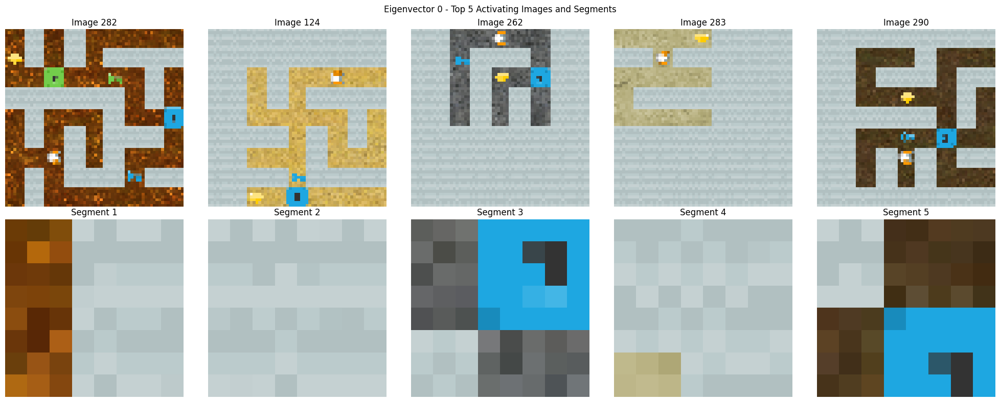

shape of input_tensor torch.Size([64, 64, 3])
the top lefts 24 40
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 56 32
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 40 24
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 40 24
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 56 32
torch.Size([64, 64, 3]) (8, 8, 3)


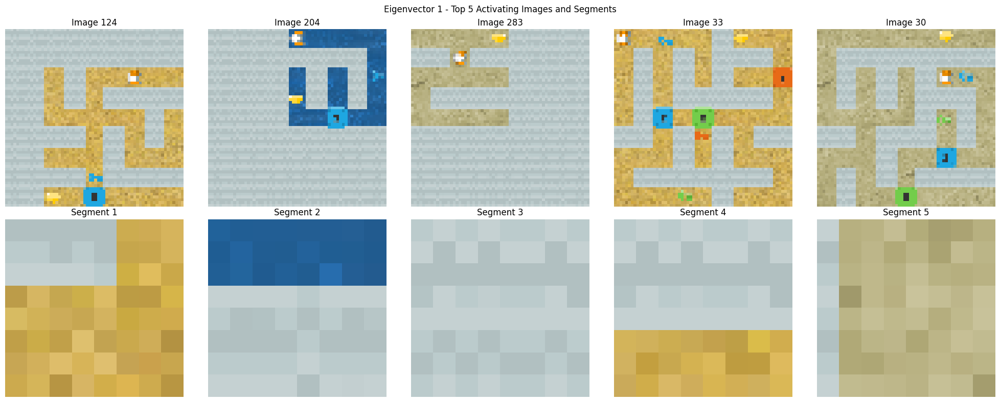

shape of input_tensor torch.Size([64, 64, 3])
the top lefts 32 48
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 56 32
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 32 24
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 32 24
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 32 40
torch.Size([64, 64, 3]) (8, 8, 3)


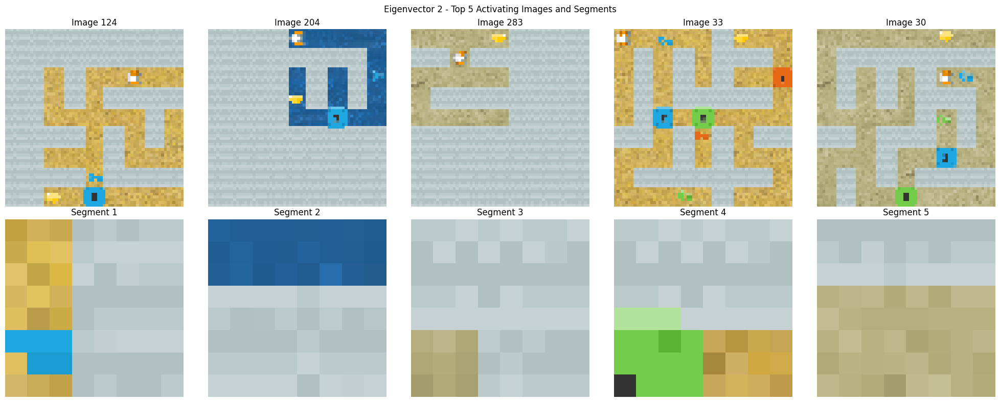

shape of input_tensor torch.Size([64, 64, 3])
the top lefts 24 40
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 48 32
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 8 24
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 48 40
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 24 24
torch.Size([64, 64, 3]) (8, 8, 3)


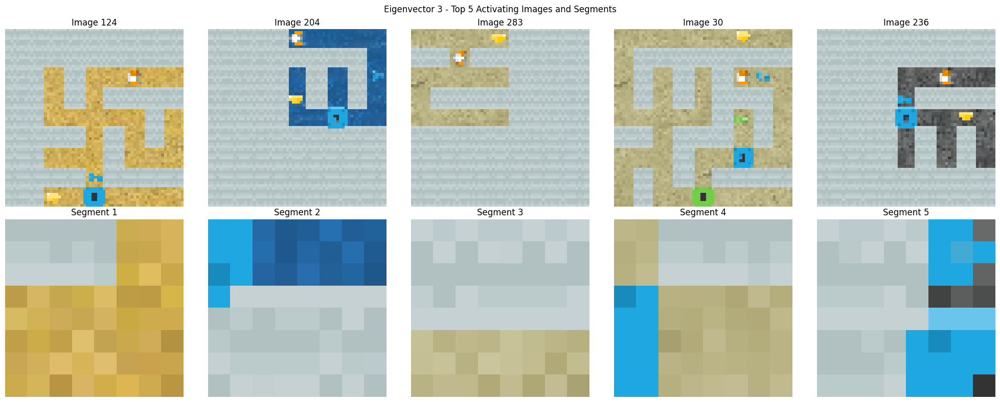

shape of input_tensor torch.Size([64, 64, 3])
the top lefts 56 32
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 16 48
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 48 40
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 56 24
torch.Size([64, 64, 3]) (8, 8, 3)
shape of input_tensor torch.Size([64, 64, 3])
the top lefts 40 48
torch.Size([64, 64, 3]) (8, 8, 3)


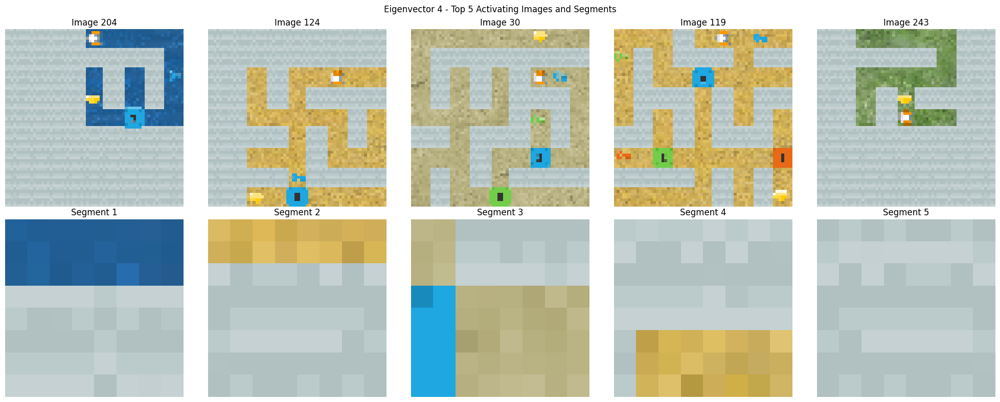

In [192]:
model_dir = '/mnt/ssd-1/mechinterp/narmeen/train-procgen-pfrl/checkpoints_bimpala_kernel7/heist/nlev_100000_easy/pistachio/trained/'
model_path = os.path.join(model_dir, 'bimpala_without_dropout_10501.0.pt')
model =load_model(model_path,7)
visualizer = EigenvectorVisualizer(model, filtered_eigenvectors, filtered_eigenvalues,"conv_seqs.2.res_block1" , create_random_dataset(), torch.device("cuda"))
visualizer.process_dataset()
visualizer.display_top_activating_segments()